In [1]:
import os
import cv2
import math
import numpy as np
from collections import OrderedDict
import scikitplot
import seaborn as sns
from matplotlib import pyplot

import tensorflow as tf
from tensorflow.keras import optimizers
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Flatten, Dense, Conv2D, MaxPooling2D
from tensorflow.keras.layers import Dropout, BatchNormalization
from tensorflow.keras.callbacks import Callback, EarlyStopping, ReduceLROnPlateau
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import plot_model

from keras import backend as K
from keras.utils import np_utils

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

Using TensorFlow backend.


In [2]:
np.random.seed(42)

In [3]:
INPUT_PATH = "../input/ck48-5-emotions/CK+48/"

total_images = 0
for dir_ in os.listdir(INPUT_PATH):
    count = 0
    for f in os.listdir(INPUT_PATH + dir_ + "/"):
        count += 1
    total_images += count
    print(f"{dir_} has {count} number of images")
    
print(f"\ntotal images: {total_images}")

anger has 135 number of images
surprise has 249 number of images
happy has 207 number of images
sadness has 84 number of images
fear has 75 number of images

total images: 750


`sadness` and `fear` has very low number of images as compared to other classes

In [4]:
TOP_EMOTIONS = ["happy", "surprise", "anger", "sadness", "fear"]

In [5]:
img_arr = np.empty(shape=(total_images, 48, 48, 1))
img_label = np.empty(shape=(total_images))
label_to_text = {}

idx = 0
label = 0
for dir_ in os.listdir(INPUT_PATH):
    if dir_ in  TOP_EMOTIONS:
        for f in os.listdir(INPUT_PATH + dir_ + "/"):
            img_arr[idx] = np.expand_dims(cv2.imread(INPUT_PATH + dir_ + "/" + f, 0), axis=2)
            img_label[idx] = label
            idx += 1
        label_to_text[label] = dir_
        label += 1

img_label = np_utils.to_categorical(img_label)

img_arr.shape, img_label.shape, label_to_text

((750, 48, 48, 1),
 (750, 5),
 {0: 'anger', 1: 'surprise', 2: 'happy', 3: 'sadness', 4: 'fear'})

In [6]:
X_train, X_test, y_train, y_test = train_test_split(img_arr, img_label, train_size=0.7, stratify=img_label, shuffle=True, random_state=42)
X_train.shape, X_test.shape

((525, 48, 48, 1), (225, 48, 48, 1))

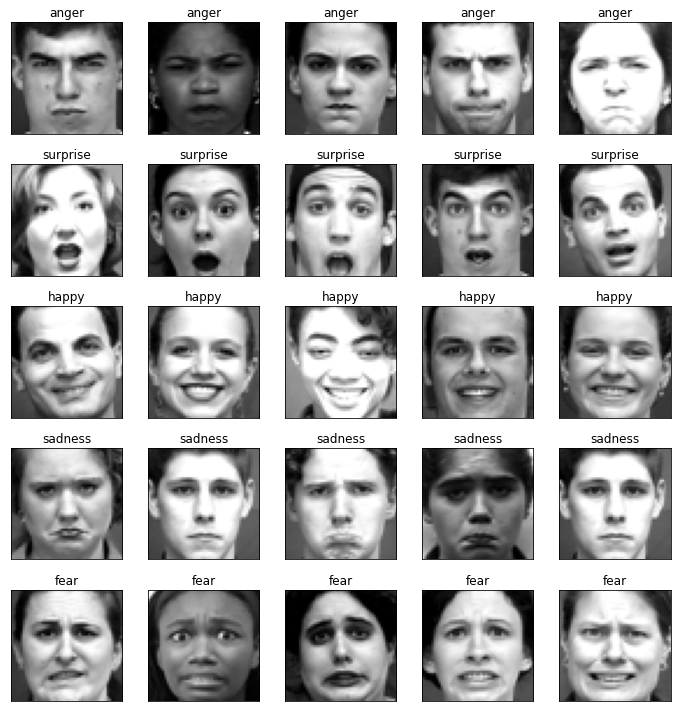

In [7]:
fig = pyplot.figure(1, (10,10))

idx = 0
for k in label_to_text:
    sample_indices = np.random.choice(np.where(y_train[:,k]==1)[0], size=5, replace=False)
    sample_images = X_train[sample_indices]
    for img in sample_images:
        idx += 1
        ax = pyplot.subplot(5,5,idx)
        ax.imshow(img.reshape(48,48), cmap='gray')
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_title(label_to_text[k])
        pyplot.tight_layout()

In [8]:
# data normalization
X_train = X_train / 255.
X_test = X_test / 255.

In [9]:
def build_dcnn(input_shape, num_classes):
    model_in = Input(shape=input_shape, name="input")
    
    conv2d_1 = Conv2D(
        filters=64,
        kernel_size=(3,3),
        activation='elu',
        padding='same',
        kernel_initializer='he_normal',
        name='conv2d_1'
    )(model_in)
    batchnorm_1 = BatchNormalization(name='batchnorm_1')(conv2d_1)
    conv2d_2 = Conv2D(
        filters=64,
        kernel_size=(3,3),
        activation='elu',
        padding='same',
        kernel_initializer='he_normal',
        name='conv2d_2'
    )(batchnorm_1)
    batchnorm_2 = BatchNormalization(name='batchnorm_2')(conv2d_2)
    
    maxpool2d_1 = MaxPooling2D(pool_size=(2,2), name='maxpool2d_1')(batchnorm_2)
    dropout_1 = Dropout(0.3, name='dropout_1')(maxpool2d_1)

    conv2d_3 = Conv2D(
        filters=128,
        kernel_size=(3,3),
        activation='elu',
        padding='same',
        kernel_initializer='he_normal',
        name='conv2d_3'
    )(dropout_1)
    batchnorm_3 = BatchNormalization(name='batchnorm_3')(conv2d_3)
    conv2d_4 = Conv2D(
        filters=128,
        kernel_size=(3,3),
        activation='elu',
        padding='same',
        kernel_initializer='he_normal',
        name='conv2d_4'
    )(batchnorm_3)
    batchnorm_4 = BatchNormalization(name='batchnorm_4')(conv2d_4)
    
    maxpool2d_2 = MaxPooling2D(pool_size=(2,2), name='maxpool2d_2')(batchnorm_4)
    dropout_2 = Dropout(0.3, name='dropout_2')(maxpool2d_2)

    conv2d_5 = Conv2D(
        filters=256,
        kernel_size=(3,3),
        activation='elu',
        padding='same',
        kernel_initializer='he_normal',
        name='conv2d_5'
    )(dropout_2)
    batchnorm_5 = BatchNormalization(name='batchnorm_5')(conv2d_5)
    conv2d_6 = Conv2D(
        filters=256,
        kernel_size=(3,3),
        activation='elu',
        padding='same',
        kernel_initializer='he_normal',
        name='conv2d_6'
    )(batchnorm_5)
    batchnorm_6 = BatchNormalization(name='batchnorm_6')(conv2d_6)
    
    maxpool2d_3 = MaxPooling2D(pool_size=(2,2), name='maxpool2d_3')(batchnorm_6)
    dropout_3 = Dropout(0.3, name='dropout_3')(maxpool2d_3)

    flatten = Flatten(name='flatten')(dropout_3)
    
    dense_1 = Dense(
        128,
        activation='elu',
        kernel_initializer='he_normal',
        name='dense1'
    )(flatten)
    batchnorm_7 = BatchNormalization(name='batchnorm_7')(dense_1)
    dropout_4 = Dropout(0.4, name='dropout_4')(batchnorm_7)

    model_out = Dense(
        num_classes,
        activation='softmax',
        name='out_layer'
    )(dropout_4)

    model = Model(inputs=model_in, outputs=model_out, name="DCNN")
    
    return model

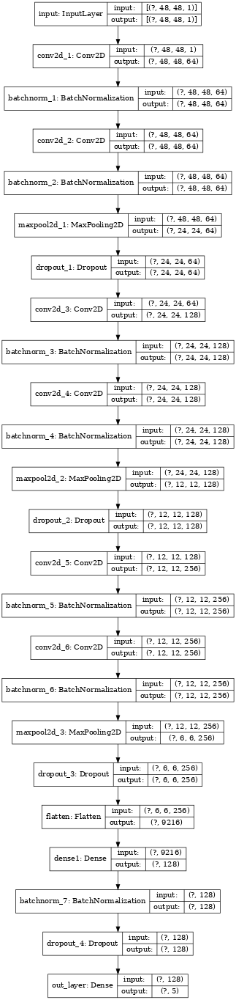

In [10]:
INPUT_SHAPE = (48, 48, 1)
optim = optimizers.Adam(0.001)

model = build_dcnn(input_shape=(48,48,1), num_classes=len(label_to_text))
model.compile(
        loss='categorical_crossentropy',
        optimizer=optim,
        metrics=['accuracy']
)

plot_model(model, show_shapes=True, show_layer_names=True, expand_nested=True, dpi=50, to_file='model.png')

In [11]:
early_stopping = EarlyStopping(
    monitor='val_loss',
    min_delta=0.00008,
    patience=12,
    verbose=1,
    restore_best_weights=True,
)

lr_scheduler = ReduceLROnPlateau(
    monitor='val_accuracy',
    min_delta=0.0001,
    factor=0.4,
    patience=6,
    min_lr=1e-7,
    verbose=1,
)

callbacks = [
    early_stopping,
    lr_scheduler,
]

batch_size = 10
epochs = 60

In [12]:
train_datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.15,
    height_shift_range=0.15,
    shear_range=0.15,
    zoom_range=0.15,
    horizontal_flip=True,
)
train_datagen.fit(X_train)

In [13]:
history = model.fit_generator(
    train_datagen.flow(X_train, y_train, batch_size=batch_size),
    validation_data=(X_test, y_test),
    steps_per_epoch=len(X_train) / batch_size,
    epochs=epochs,
    callbacks=callbacks,
    use_multiprocessing=True
)

Train for 52.5 steps, validate on 225 samples
Epoch 1/60
53/52 [==============================] - 6s 118ms/step - loss: 1.8957 - accuracy: 0.3962 - val_loss: 9.0913 - val_accuracy: 0.1956
Epoch 2/60
53/52 [==============================] - 1s 15ms/step - loss: 1.2157 - accuracy: 0.5448 - val_loss: 1.6065 - val_accuracy: 0.4711
Epoch 3/60
53/52 [==============================] - 1s 15ms/step - loss: 0.9095 - accuracy: 0.6781 - val_loss: 1.4046 - val_accuracy: 0.6000
Epoch 4/60
53/52 [==============================] - 1s 16ms/step - loss: 0.8761 - accuracy: 0.7048 - val_loss: 1.2494 - val_accuracy: 0.6489
Epoch 5/60
53/52 [==============================] - 1s 16ms/step - loss: 0.7648 - accuracy: 0.7105 - val_loss: 0.8597 - val_accuracy: 0.7467
Epoch 6/60
53/52 [==============================] - 1s 15ms/step - loss: 0.7554 - accuracy: 0.7238 - val_loss: 0.9634 - val_accuracy: 0.6533
Epoch 7/60
53/52 [==============================] - 1s 16ms/step - loss: 0.7750 - accuracy: 0.7105 - val_lo

Epoch 54/60
49/52 [===========================>..] - ETA: 0s - loss: 0.1220 - accuracy: 0.9670
Epoch 00054: ReduceLROnPlateau reducing learning rate to 1.0240000847261399e-05.
53/52 [==============================] - 1s 17ms/step - loss: 0.1224 - accuracy: 0.9676 - val_loss: 0.1662 - val_accuracy: 0.9511
Epoch 55/60
53/52 [==============================] - 1s 16ms/step - loss: 0.1608 - accuracy: 0.9467 - val_loss: 0.1710 - val_accuracy: 0.9467
Epoch 56/60
53/52 [==============================] - 1s 16ms/step - loss: 0.1732 - accuracy: 0.9486 - val_loss: 0.1684 - val_accuracy: 0.9422
Epoch 57/60
53/52 [==============================] - 1s 23ms/step - loss: 0.1360 - accuracy: 0.9581 - val_loss: 0.1642 - val_accuracy: 0.9467
Epoch 58/60
53/52 [==============================] - 1s 21ms/step - loss: 0.1546 - accuracy: 0.9486 - val_loss: 0.1686 - val_accuracy: 0.9467
Epoch 59/60
53/52 [==============================] - 1s 16ms/step - loss: 0.1382 - accuracy: 0.9562 - val_loss: 0.1766 - val_a

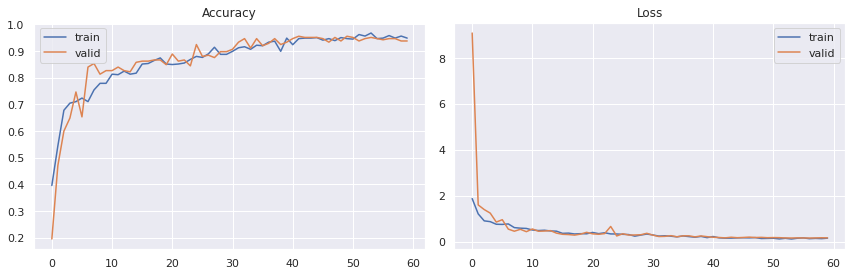

In [14]:
sns.set()
fig = pyplot.figure(0, (12, 4))

ax = pyplot.subplot(1, 2, 1)
sns.lineplot(history.epoch, history.history['accuracy'], label='train')
sns.lineplot(history.epoch, history.history['val_accuracy'], label='valid')
pyplot.title('Accuracy')
pyplot.tight_layout()

ax = pyplot.subplot(1, 2, 2)
sns.lineplot(history.epoch, history.history['loss'], label='train')
sns.lineplot(history.epoch, history.history['val_loss'], label='valid')
pyplot.title('Loss')
pyplot.tight_layout()

pyplot.savefig('epoch_history.png')
pyplot.show()

In [15]:
label_to_text

{0: 'anger', 1: 'surprise', 2: 'happy', 3: 'sadness', 4: 'fear'}

In [16]:
text_to_label = dict((v,k) for k,v in label_to_text.items())
text_to_label

{'anger': 0, 'surprise': 1, 'happy': 2, 'sadness': 3, 'fear': 4}

test accuracy: 93.7778 %


              precision    recall  f1-score   support

           0       0.95      0.90      0.92        40
           1       1.00      0.93      0.97        75
           2       0.91      1.00      0.95        62
           3       0.85      0.92      0.88        25
           4       0.91      0.87      0.89        23

    accuracy                           0.94       225
   macro avg       0.92      0.92      0.92       225
weighted avg       0.94      0.94      0.94       225



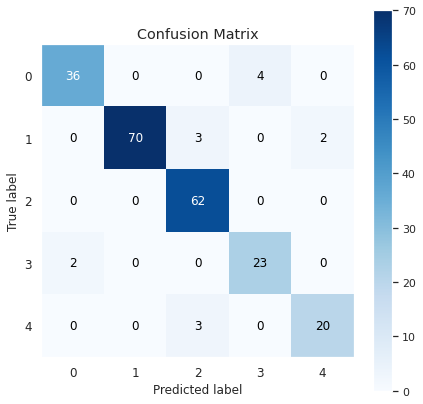

In [17]:
yhat_test = model.predict(X_test)
yhat_test = np.argmax(yhat_test, axis=1)
ytest_ = np.argmax(y_test, axis=1)

scikitplot.metrics.plot_confusion_matrix(ytest_, yhat_test, figsize=(7,7))
pyplot.savefig("confusion_matrix_model3pipes.png")

test_accu = np.sum(ytest_ == yhat_test) / len(ytest_) * 100
print(f"test accuracy: {round(test_accu, 4)} %\n\n")

print(classification_report(ytest_, yhat_test))

In [18]:
layer_list = [(layer.name, layer) for layer in model.layers if "conv" in layer.name]
layer_list

[('conv2d_1',
  <tensorflow.python.keras.layers.convolutional.Conv2D at 0x7fe7e5004ac8>),
 ('conv2d_2',
  <tensorflow.python.keras.layers.convolutional.Conv2D at 0x7fe79cfa6160>),
 ('conv2d_3',
  <tensorflow.python.keras.layers.convolutional.Conv2D at 0x7fe79f57d630>),
 ('conv2d_4',
  <tensorflow.python.keras.layers.convolutional.Conv2D at 0x7fe79c731c88>),
 ('conv2d_5',
  <tensorflow.python.keras.layers.convolutional.Conv2D at 0x7fe79c75b630>),
 ('conv2d_6',
  <tensorflow.python.keras.layers.convolutional.Conv2D at 0x7fe79c7179e8>)]

## Let's Visualize What our CNN Learned

#### Plot Filters

In [37]:
INTERESTED_CONV_LAYERS = ["conv2d_1", "conv2d_4"]

CPU times: user 1min 11s, sys: 8.75 s, total: 1min 20s
Wall time: 1min 11s


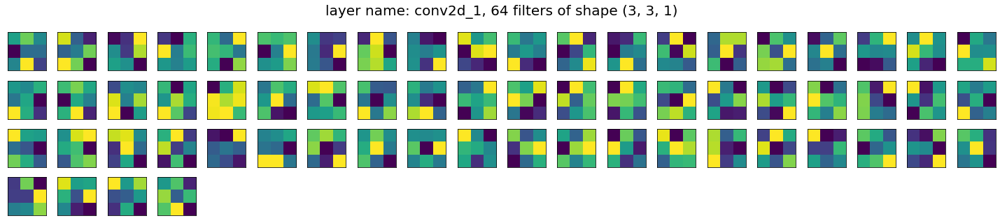

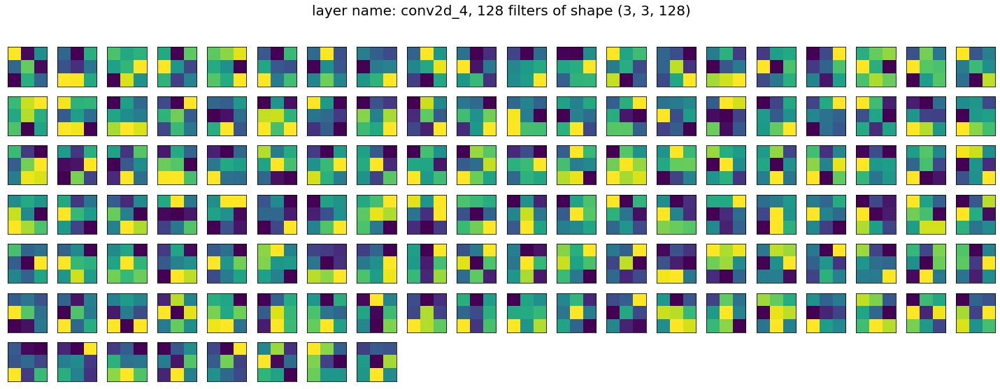

In [38]:
%%time

idx = 1
for layer in layer_list:
    if layer[0] in INTERESTED_CONV_LAYERS:        
        layer_output = layer[1].output
        filters, bias = layer[1].get_weights()     
        filters = (filters - filters.min()) / (filters.max() - filters.min())
    
        cols = 20
        rows = math.ceil(filters.shape[-1] / cols)
        fig = pyplot.figure(i, (20, rows))

        idx += 1
        for i,f in enumerate(np.rollaxis(filters, 3)):
            ax = pyplot.subplot(rows, cols, i+1)
            f = np.mean(f, axis=2)
            ax.imshow(f, cmap="viridis")
            ax.set_xticks([])
            ax.set_yticks([])
            pyplot.suptitle(f"layer name: {layer[0]}, {filters.shape[3]} filters of shape {filters.shape[:-1]}", fontsize=20, y=1.1)
            pyplot.tight_layout()

#### Plot Feature Maps

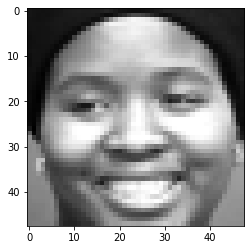

In [21]:
sns.reset_orig()
sample_img = X_test[0] # select a random image
pyplot.imshow(sample_img.reshape(48,48), cmap="gray")
pyplot.show()

In [22]:
sample_img = np.expand_dims(sample_img, axis=0)
sample_img.shape

(1, 48, 48, 1)

In [23]:
INTERESTED_CONV_LAYERS = ["conv2d_1", "conv2d_4"]

CPU times: user 1min 11s, sys: 8.34 s, total: 1min 19s
Wall time: 1min 11s


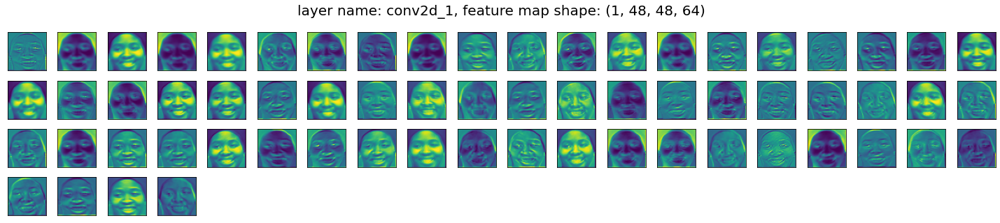

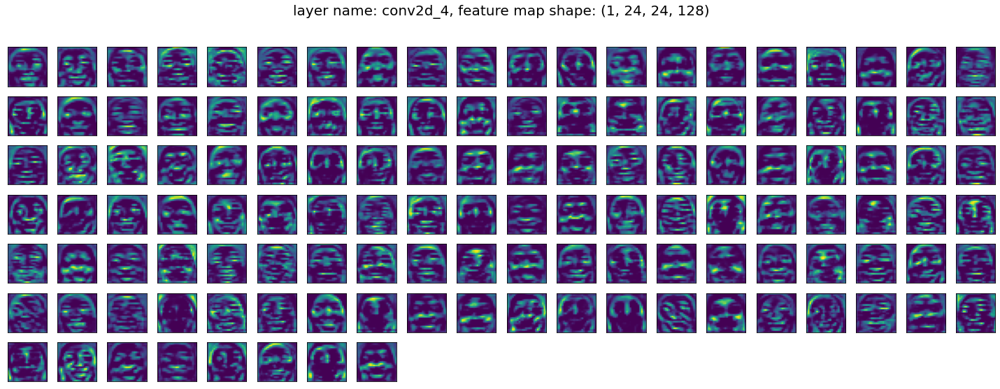

In [24]:
%%time

i = 1
for layer in layer_list:
    if layer[0] in INTERESTED_CONV_LAYERS:    
        model_conv2d = Model(inputs=model.inputs, outputs=layer[1].output)
        featuremaps_conv2d = model_conv2d.predict(sample_img)

        cols = 20
        rows = math.ceil(featuremaps_conv2d.shape[-1] / cols)
        fig = pyplot.figure(i, (20, rows))        
        i += 1
        
        for idx, feature_map in enumerate(np.rollaxis(featuremaps_conv2d, axis=3)):
            ax = pyplot.subplot(rows, cols ,idx+1)
            ax.imshow(feature_map[0], cmap="viridis")
            ax.set_xticks([])
            ax.set_yticks([])
            pyplot.suptitle(f"layer name: {layer[0]}, feature map shape: {featuremaps_conv2d.shape}", fontsize=20, y=1.1)
            pyplot.tight_layout()

We can see that the first convolutional layer has detected many edges in the image and indeed this is what we expected.

#### Plot Class Activation Map (CAM) 
The following CAM is taken from [here](https://github.com/himanshurawlani/convnet-interpretability-keras/blob/master/Visualizing%20heatmaps/heatmap_visualization_using_gradcam.ipynb).

In [25]:
INTERESTED_CONV_LAYERS = ["conv2d_1", "conv2d_2", "conv2d_3", "conv2d_4", "conv2d_5", "conv2d_6"]

In [26]:
preds = model.predict(sample_img)
label_to_text[np.argmax(preds[0])]

'happy'

In [27]:
pred_vector_output = model.output[:, np.argmax(preds[0])]
pred_vector_output

<tf.Tensor 'strided_slice:0' shape=(None,) dtype=float32>

In [28]:
heatmaps = []

for layer in layer_list:
    if layer[0] in INTERESTED_CONV_LAYERS:
        some_conv_layer = model.get_layer(layer[0])
        grads = K.gradients(pred_vector_output, some_conv_layer.output)[0]
        pooled_grads = K.mean(grads, axis=(0, 1, 2))
        iterate = K.function([model.input], [pooled_grads, some_conv_layer.output[0]])
        pooled_grads_value, conv_layer_output_value = iterate([sample_img])

        for i in range(model.get_layer(layer[0]).output_shape[-1]):
            conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

        heatmaps.append(np.mean(conv_layer_output_value, axis=-1))

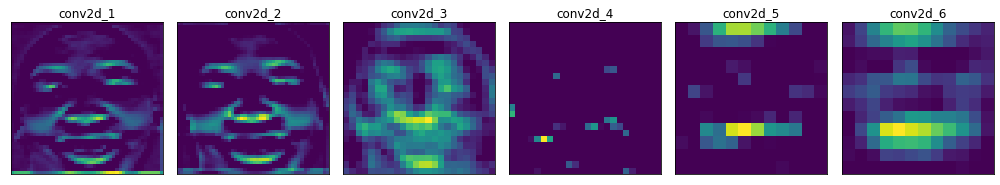

In [29]:
fig = pyplot.figure(figsize=(14, 3))

for i, (name,hm) in enumerate(zip(INTERESTED_CONV_LAYERS, heatmaps)):
    ax = pyplot.subplot(1, 6, i+1)
    img_heatmap = np.maximum(hm, 0)
    img_heatmap /= np.max(img_heatmap)
    ax.imshow(img_heatmap, cmap="viridis")
    ax.set_xticks([])
    ax.set_yticks([])
    pyplot.title(name)
    pyplot.tight_layout()

We can see that our model focuses on important aspects of the image i.e., `lips`, `eyes` and `eyebrows`.

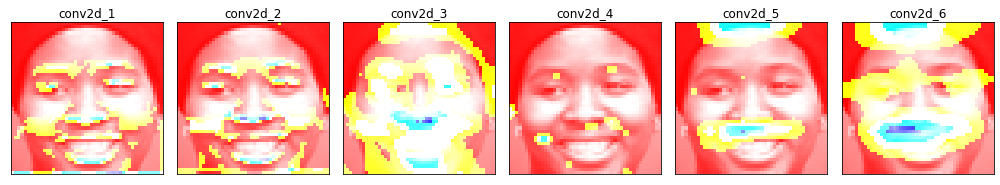

In [30]:
fig = pyplot.figure(figsize=(14, 3))

for i, (name,hm) in enumerate(zip(INTERESTED_CONV_LAYERS, heatmaps)):
    img_heatmap = np.maximum(hm, 0)
    img_heatmap /= np.max(img_heatmap)
    
    img_hm = cv2.resize(img_heatmap, (48,48))
    img_hm = np.uint8(255 * img_hm)

    img_hm = cv2.applyColorMap(img_hm, cv2.COLORMAP_JET)

    # 0.4 here is a heatmap intensity factor
    superimposed_img = img_hm * 0.4 + sample_img

    ax = pyplot.subplot(1, 6, i+1)
    ax.imshow(superimposed_img[0,:,:])
    ax.set_xticks([])
    ax.set_yticks([])
    pyplot.title(name)
    pyplot.tight_layout()

Infact this all can be done just using few lines of code using some interesting libraries like `keract`, `keras-viz`, `lucid`. Below I showed keract

In [31]:
! pip install keract

In [32]:
from keract import get_activations, display_activations, display_heatmaps

In [33]:
activations = get_activations(model, sample_img)
activations.keys()

odict_keys(['input', 'conv2d_1', 'batchnorm_1', 'conv2d_2', 'batchnorm_2', 'maxpool2d_1', 'dropout_1', 'conv2d_3', 'batchnorm_3', 'conv2d_4', 'batchnorm_4', 'maxpool2d_2', 'dropout_2', 'conv2d_5', 'batchnorm_5', 'conv2d_6', 'batchnorm_6', 'maxpool2d_3', 'dropout_3', 'flatten', 'dense1', 'batchnorm_7', 'dropout_4', 'out_layer'])

As there are many layers in the model and visualizing all of them is not very informative, so I just plotted the interested ones i.e., conv layers

In [34]:
INTERESTED_CONV_LAYERS = ["conv2d_1", "conv2d_2", "conv2d_3", "conv2d_4", "conv2d_5", "conv2d_6", "dense1", "out_layer"]

activations_convs = OrderedDict()

for k,v in activations.items():
    if k in INTERESTED_CONV_LAYERS:
        activations_convs[k] = v
        
activations_convs.keys()

odict_keys(['conv2d_1', 'conv2d_2', 'conv2d_3', 'conv2d_4', 'conv2d_5', 'conv2d_6', 'dense1', 'out_layer'])

conv2d_1 (1, 48, 48, 64) 


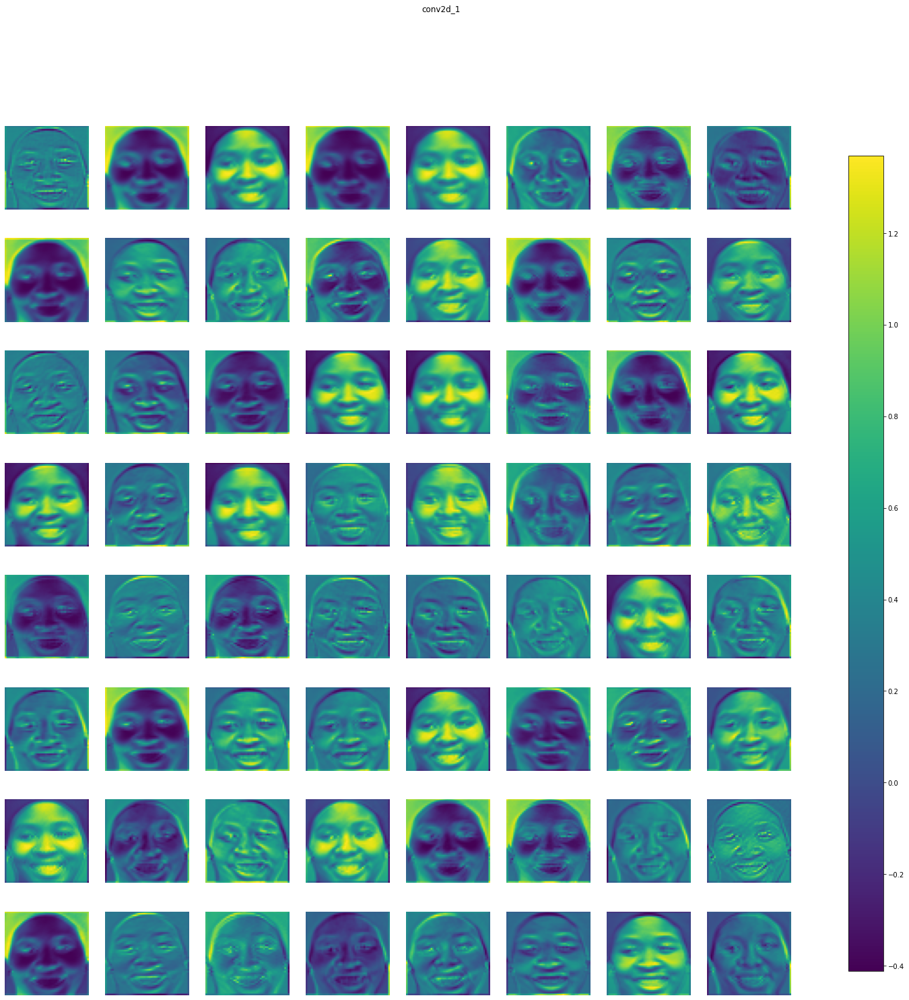

conv2d_2 (1, 48, 48, 64) 


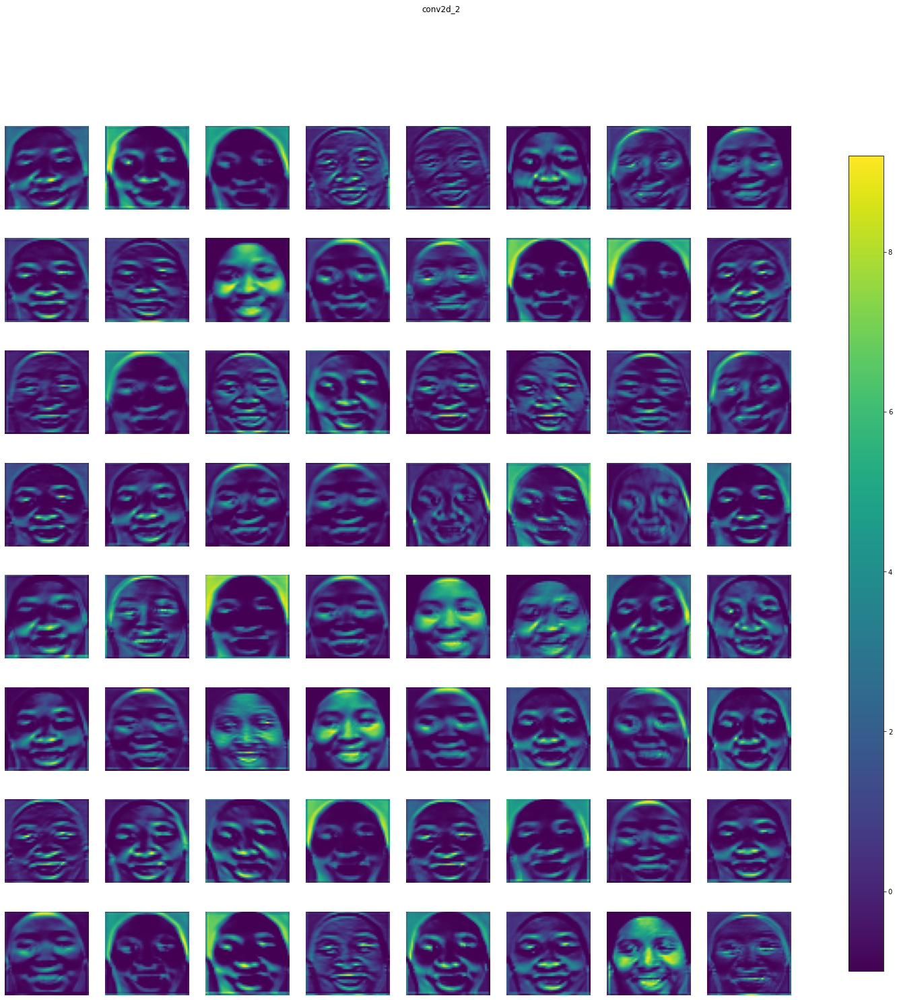

conv2d_3 (1, 24, 24, 128) 


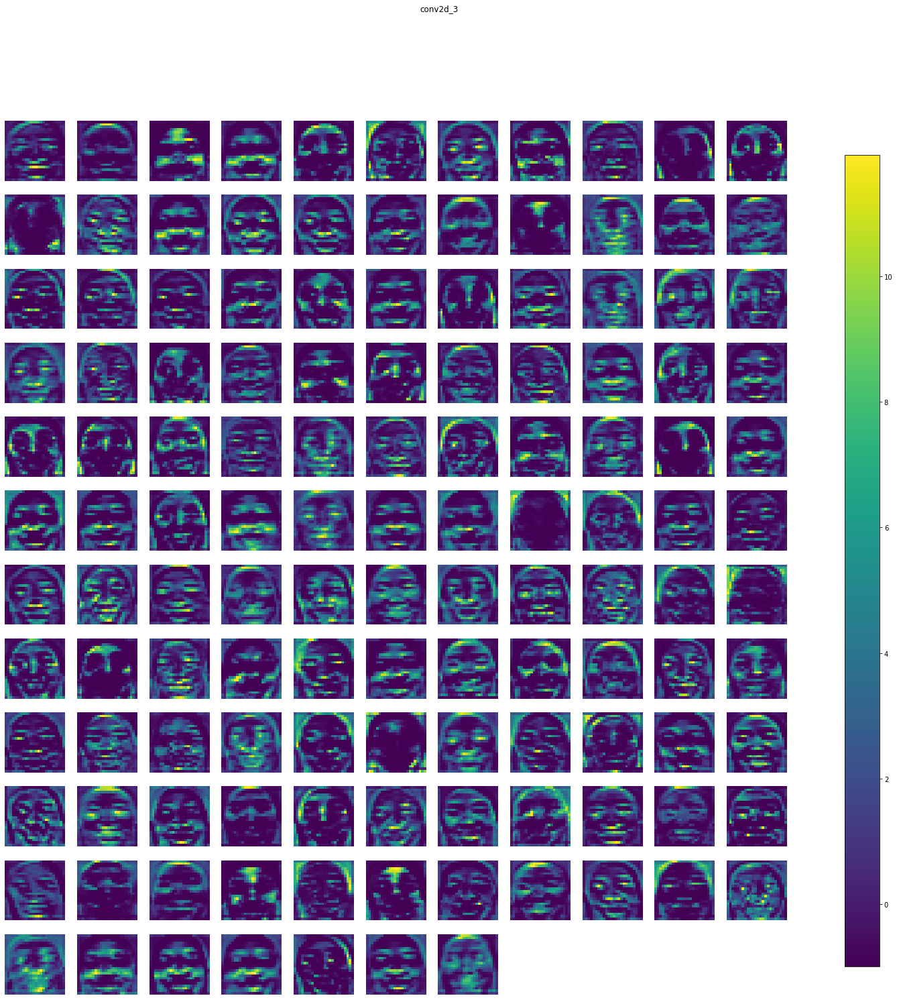

conv2d_4 (1, 24, 24, 128) 


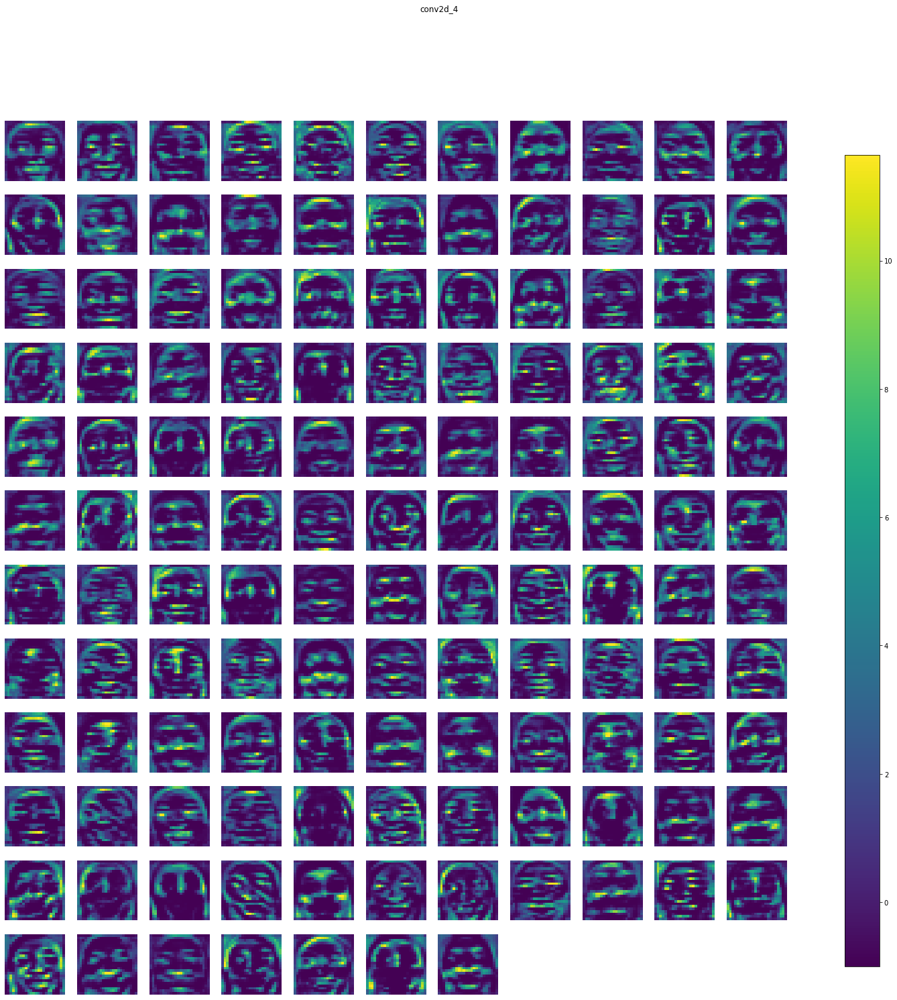

conv2d_5 (1, 12, 12, 256) 


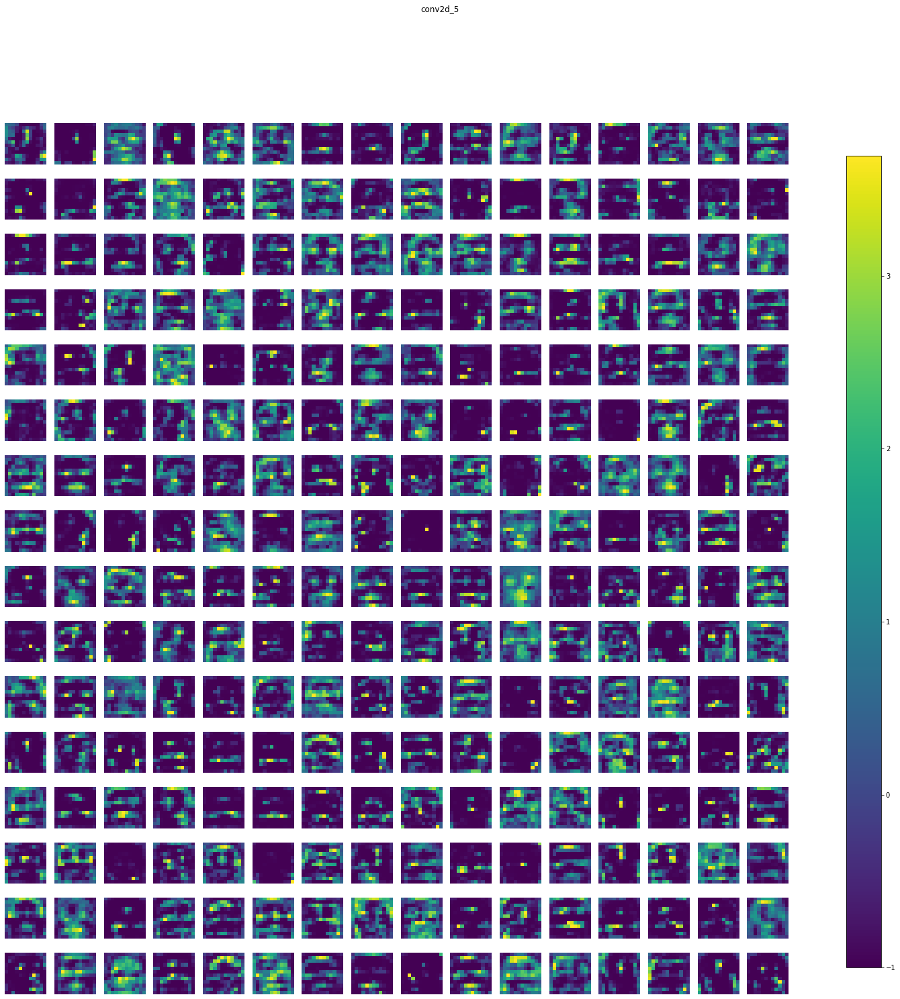

conv2d_6 (1, 12, 12, 256) 


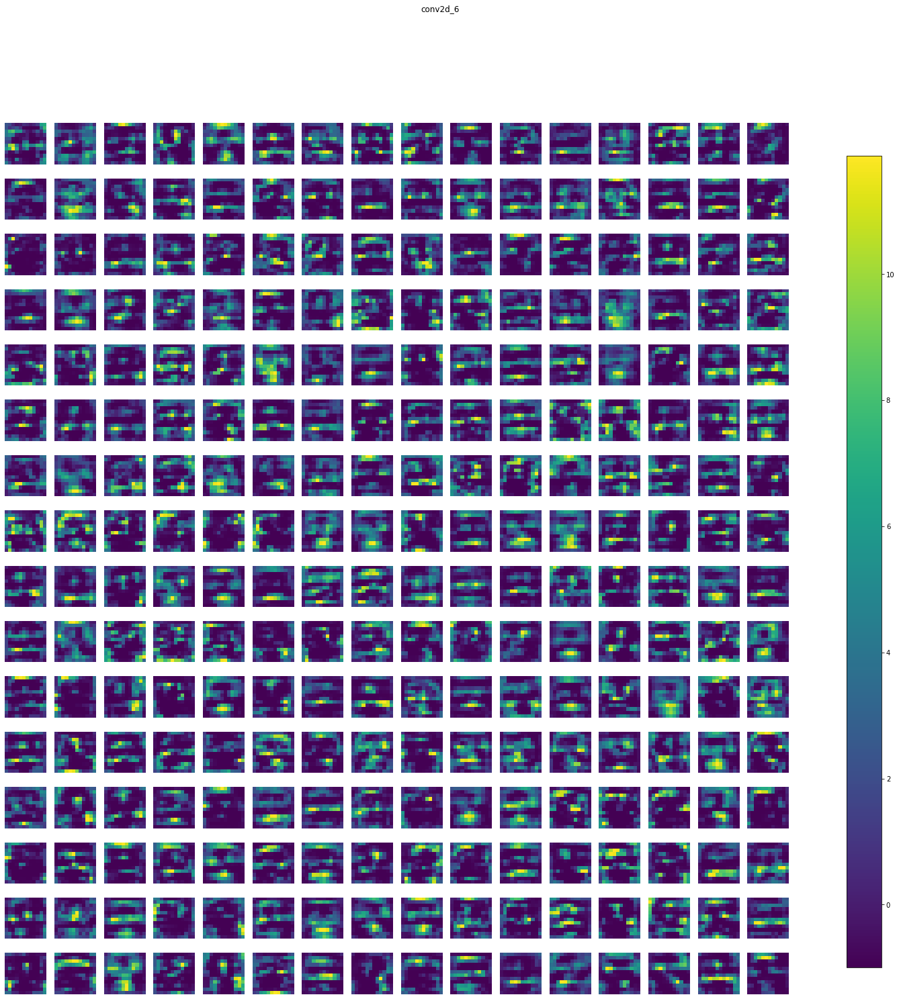

dense1 (1, 128) 


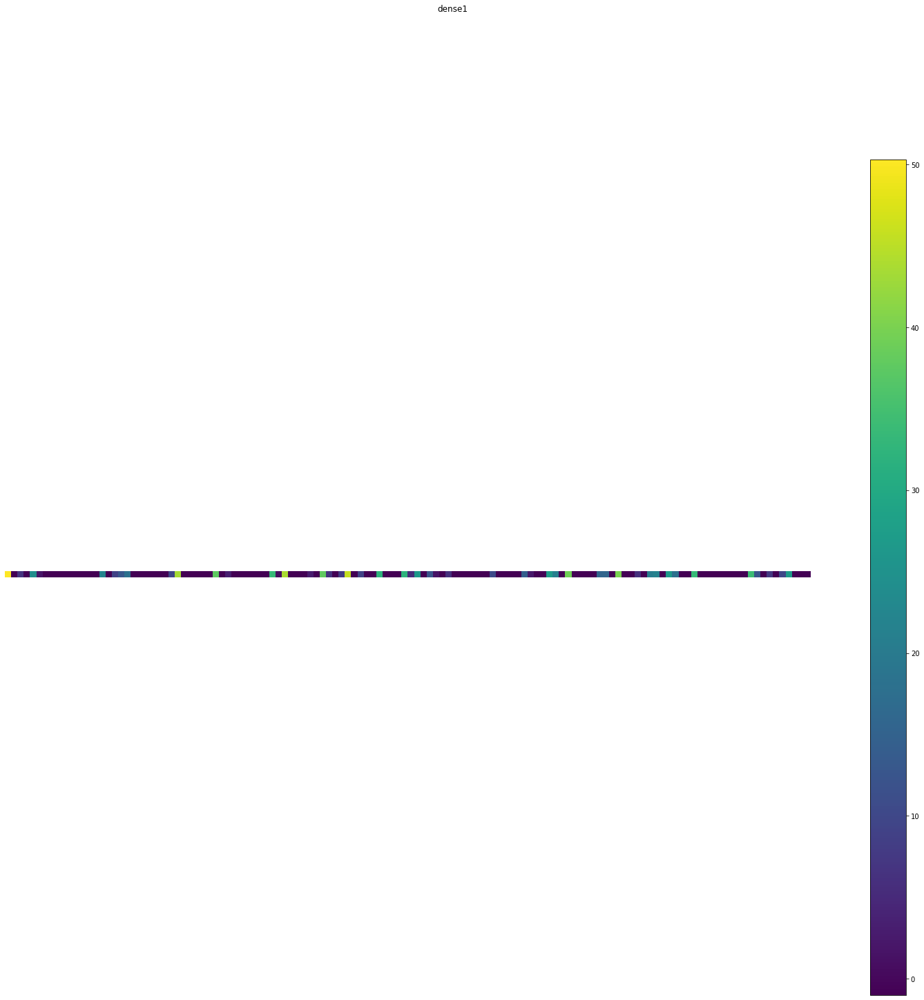

out_layer (1, 5) 


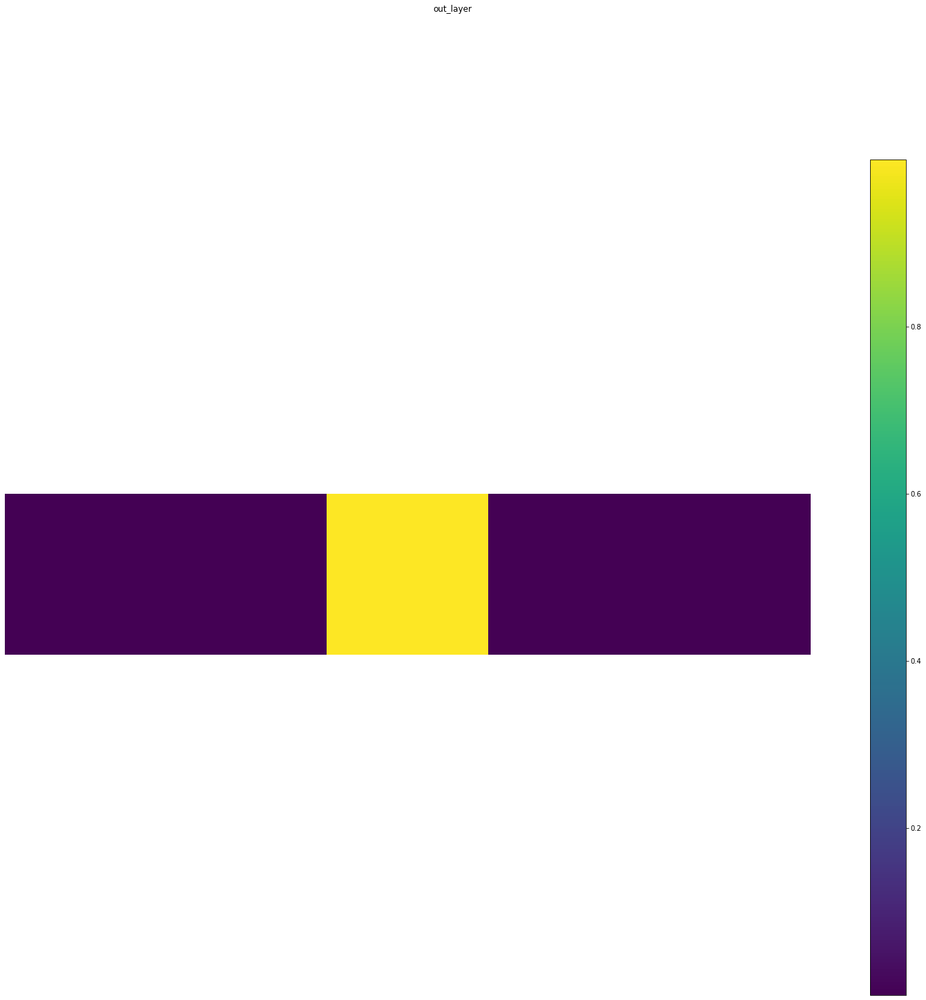

In [35]:
display_activations(activations_convs, save=False)

conv2d_1 (1, 48, 48, 64) 


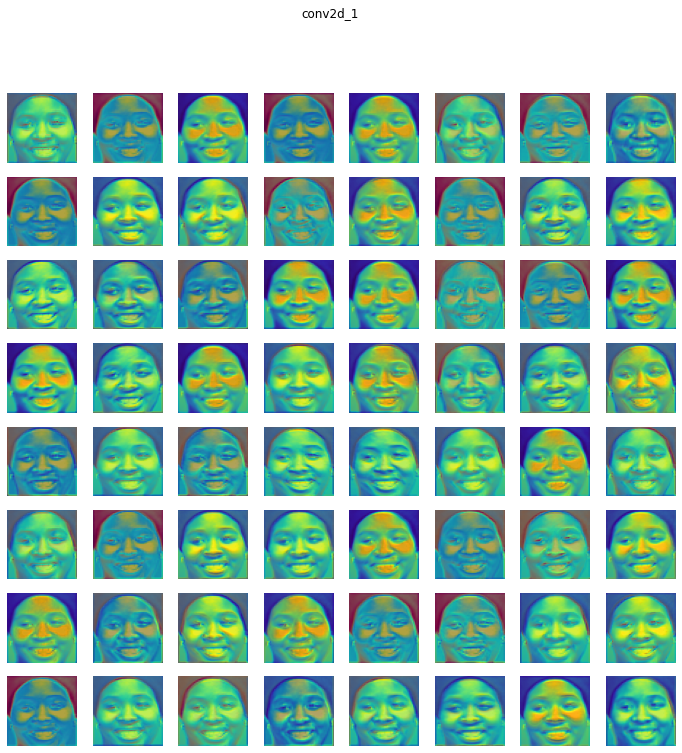

conv2d_2 (1, 48, 48, 64) 


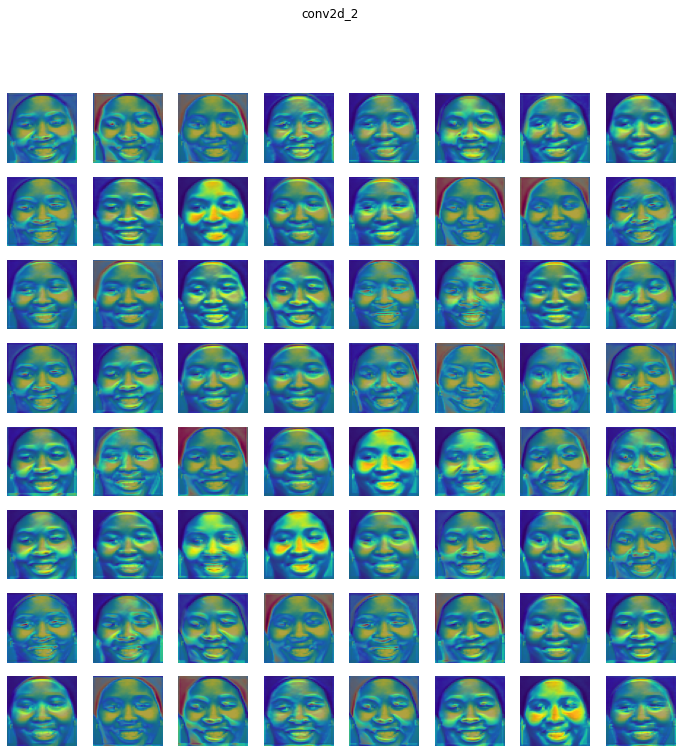

conv2d_3 (1, 24, 24, 128) 


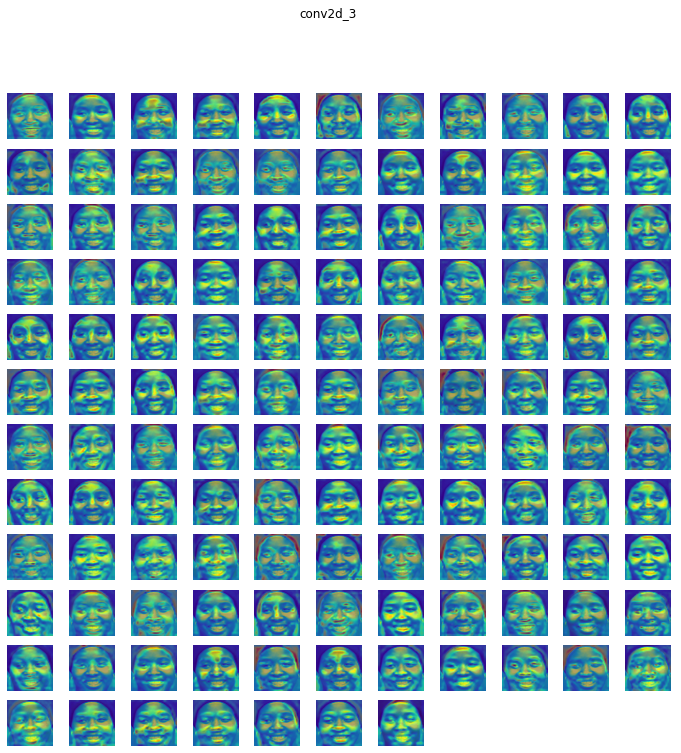

conv2d_4 (1, 24, 24, 128) 


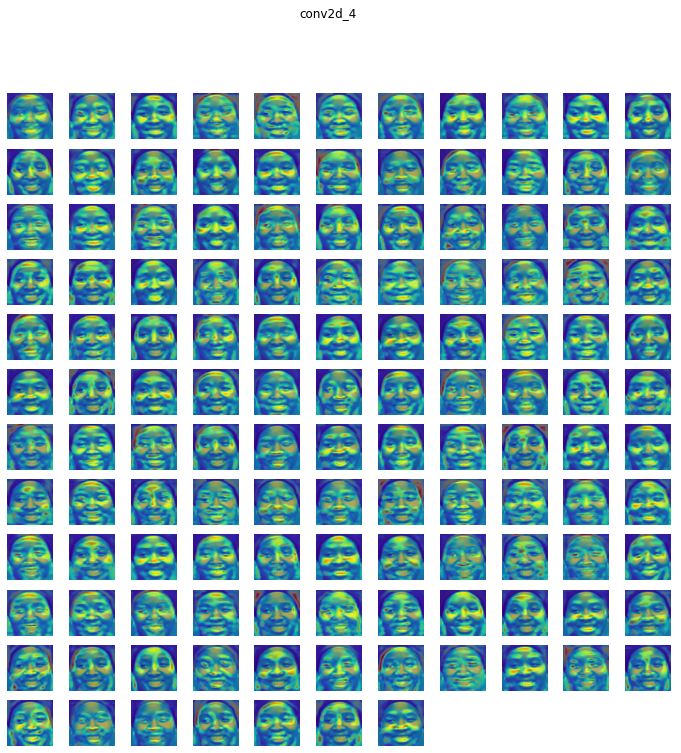

conv2d_5 (1, 12, 12, 256) 


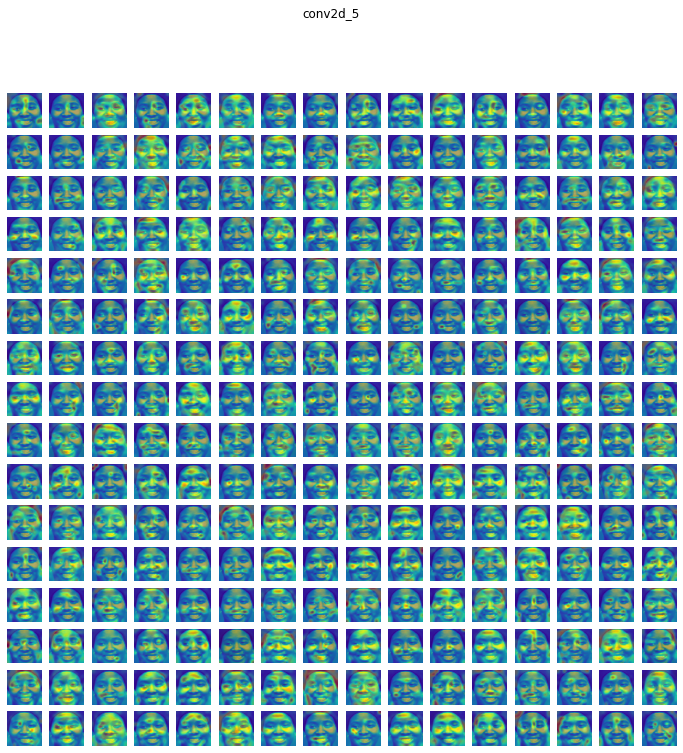

conv2d_6 (1, 12, 12, 256) 


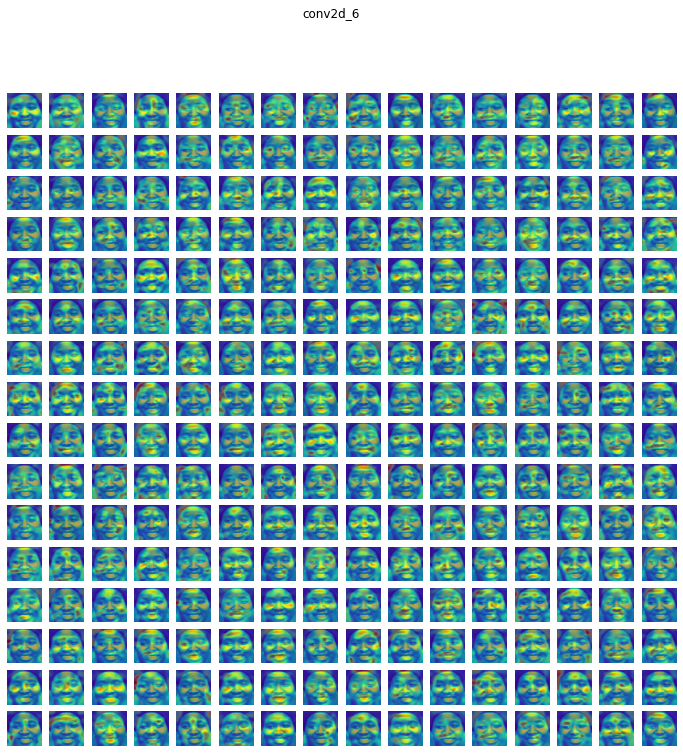

dense1 (1, 128) -> Skipped. 2D Activations.
out_layer (1, 5) -> Skipped. 2D Activations.


In [36]:
display_heatmaps(activations_convs, sample_img, save=False)

**If you like this notebook then please upvote and share with others and also see my other kernels on [EDA](https://www.kaggle.com/gauravsharma99/eda-on-mpg-data), [Statistical Analysis](https://www.kaggle.com/gauravsharma99/statistical-analysis-on-mpg-data), [NSL](https://www.kaggle.com/gauravsharma99/neural-structured-learning), [etc.](https://www.kaggle.com/notebooks)**